# ♻️ Drinking Waste Classification & Detection
### YOLOv8 Object Detection Pipeline
**Dataset:** Images_of_Waste | **Classes:** AluCan, Glass, HDPEM, PET

---
**Workflow:**
1. Mount Google Drive & install dependencies
2. EDA — explore the dataset
3. Prepare YOLO dataset (split + data.yaml)
4. Train YOLOv8m with advanced augmentation
5. Evaluate with full metrics + visualizations
6. GradCAM heatmaps
7. Deploy Gradio web app


## 🔧 Step 0: Setup

In [1]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Verify dataset exists
import os
dataset_path = '/content/drive/MyDrive/Images_of_Waste'
assert os.path.exists(dataset_path), f'Dataset not found at {dataset_path}'
print('✅ Dataset found!')
print('Contents:', os.listdir(dataset_path))

Mounted at /content/drive
✅ Dataset found!
Contents: ['rawimgs', 'YOLO_imgs']


In [2]:
# Install dependencies
!pip install ultralytics gradio -q

from ultralytics import YOLO
import torch
print(f'Ultralytics: OK')
print(f'GPU: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU only — switch to GPU Runtime!"}')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 31.3 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics: OK
GPU: Tesla T4


In [3]:
# Clone/copy project scripts (or run inline)
import os
os.makedirs('/content/scripts', exist_ok=True)

# Copy scripts from Drive if you uploaded them, OR paste code below
# For this notebook we run key steps inline.

## 📊 Step 1: EDA — Exploratory Data Analysis

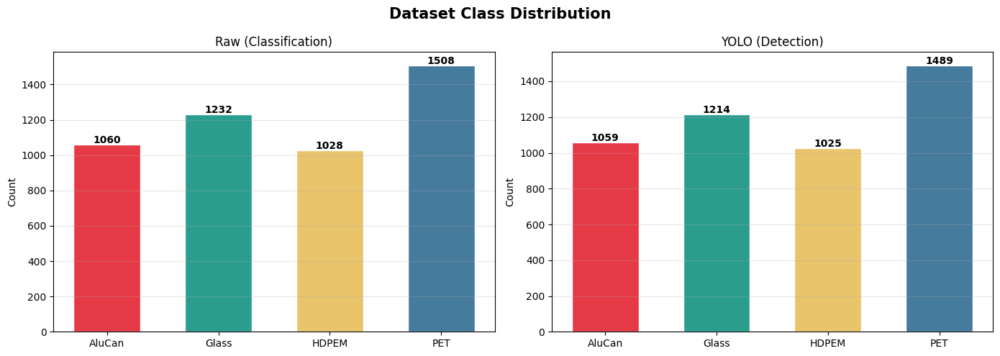

Total YOLO pairs: 4787
Total raw images: 4828


In [4]:
from pathlib import Path
from collections import defaultdict, Counter
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

YOLO_DIR   = '/content/drive/MyDrive/Images_of_Waste/YOLO_imgs'
RAW_DIR    = '/content/drive/MyDrive/Images_of_Waste/rawimgs'
CLASS_NAMES = ['AluCan', 'Glass', 'HDPEM', 'PET']
COLORS      = ['#E63946', '#2A9D8F', '#E9C46A', '#457B9D']

# ── Class distribution ───────────────────────────────────────────────────────
yolo_counts = defaultdict(int)
raw_counts  = {}

for cls in CLASS_NAMES:
    d = Path(RAW_DIR) / cls
    raw_counts[cls] = len(list(d.glob('*.*'))) if d.exists() else 0

for txt in Path(YOLO_DIR).rglob('*.txt'):
    for cls in CLASS_NAMES:
        if txt.name.startswith(cls):
            yolo_counts[cls] += 1

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Dataset Class Distribution', fontsize=15, fontweight='bold')

raw_vals  = [raw_counts.get(c, 0) for c in CLASS_NAMES]
yolo_vals = [yolo_counts.get(c, 0) for c in CLASS_NAMES]

for ax, vals, title in zip(axes, [raw_vals, yolo_vals],
                            ['Raw (Classification)', 'YOLO (Detection)']):
    bars = ax.bar(CLASS_NAMES, vals, color=COLORS, edgecolor='white', width=0.6)
    ax.set_title(title, fontsize=12)
    ax.set_ylabel('Count')
    for b, v in zip(bars, vals):
        ax.text(b.get_x() + b.get_width()/2, b.get_height()+8, str(v),
                ha='center', fontweight='bold')
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('/content/class_distribution.png', dpi=150)
plt.show()
print('Total YOLO pairs:', sum(yolo_vals))
print('Total raw images:', sum(raw_vals))

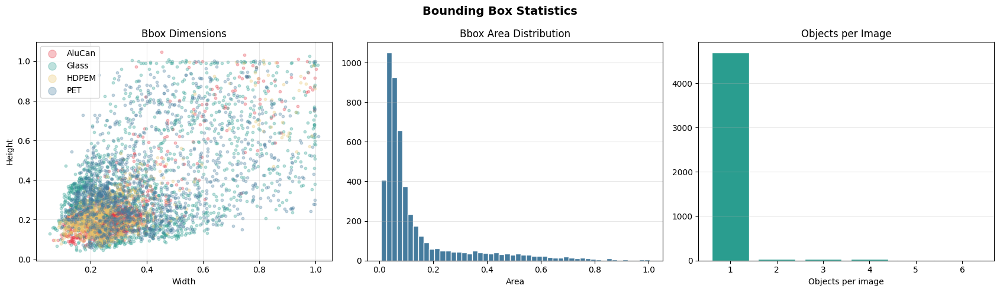

In [5]:
# ── Bounding box statistics ───────────────────────────────────────────────────
widths, heights, cls_ids = [], [], []
boxes_per_file = Counter()

for txt_file in Path(YOLO_DIR).rglob('*.txt'):
    lines = [l.strip() for l in open(txt_file) if l.strip()]
    boxes_per_file[len(lines)] += 1
    for line in lines:
        p = line.split()
        if len(p) == 5:
            cls_ids.append(int(p[0]))
            widths.append(float(p[3]))
            heights.append(float(p[4]))

widths, heights = np.array(widths), np.array(heights)

fig, axes = plt.subplots(1, 3, figsize=(17, 5))
fig.suptitle('Bounding Box Statistics', fontsize=14, fontweight='bold')

for cid in range(len(CLASS_NAMES)):
    m = np.array(cls_ids) == cid
    axes[0].scatter(widths[m], heights[m], alpha=0.3, s=10,
                    color=COLORS[cid], label=CLASS_NAMES[cid])
axes[0].set_xlabel('Width'); axes[0].set_ylabel('Height')
axes[0].set_title('Bbox Dimensions'); axes[0].legend(markerscale=3)
axes[0].grid(alpha=0.3)

axes[1].hist(widths * heights, bins=50, color='#457B9D', edgecolor='white')
axes[1].set_xlabel('Area'); axes[1].set_title('Bbox Area Distribution')
axes[1].grid(axis='y', alpha=0.3)

lbl = sorted(boxes_per_file); vals = [boxes_per_file[k] for k in lbl]
axes[2].bar([str(l) for l in lbl], vals, color='#2A9D8F', edgecolor='white')
axes[2].set_xlabel('Objects per image'); axes[2].set_title('Objects per Image')
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('/content/bbox_stats.png', dpi=150)
plt.show()

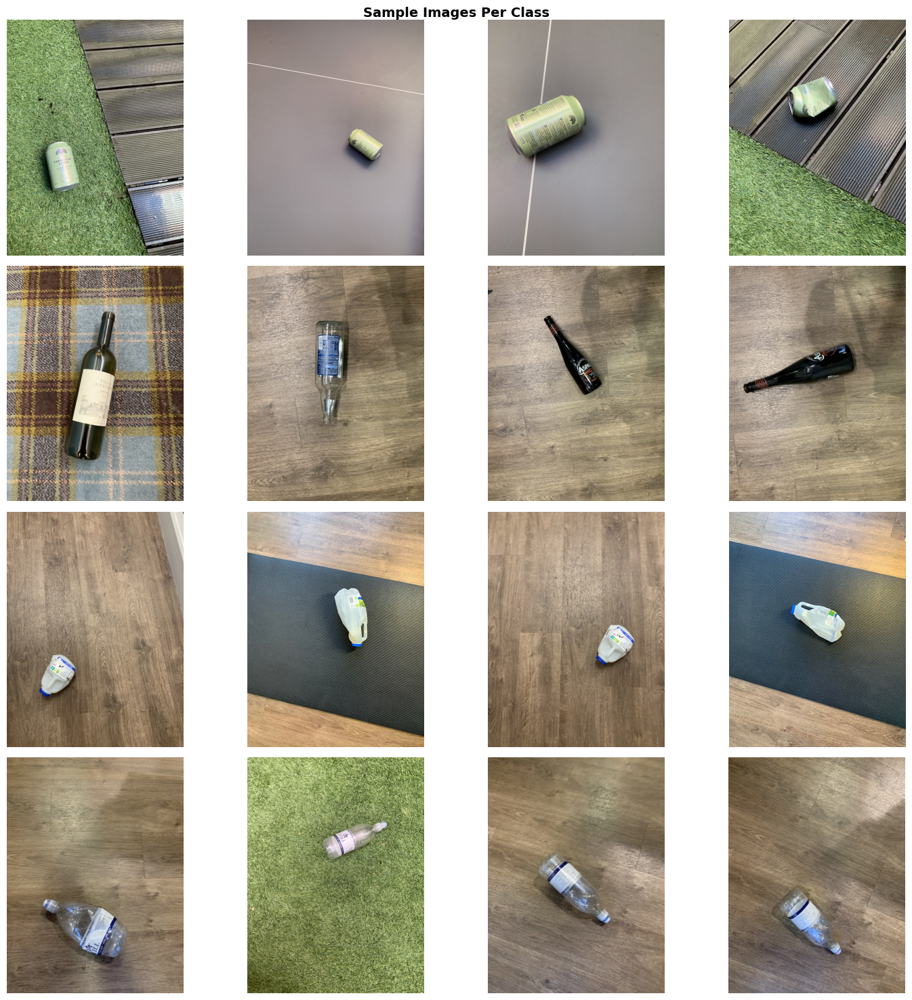

In [6]:
# ── Sample image grid ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(4, 4, figsize=(15, 15))
fig.suptitle('Sample Images Per Class', fontsize=14, fontweight='bold')

for row, cls in enumerate(CLASS_NAMES):
    imgs = list(Path(YOLO_DIR).rglob(f'{cls}*.jpg'))[:4]
    for col in range(4):
        ax = axes[row, col]
        if col < len(imgs):
            img = cv2.cvtColor(cv2.imread(str(imgs[col])), cv2.COLOR_BGR2RGB)
            ax.imshow(img)
        ax.axis('off')
        if col == 0:
            ax.set_ylabel(cls, fontsize=12, fontweight='bold',
                          rotation=0, labelpad=65, va='center')

plt.tight_layout()
plt.savefig('/content/sample_grid.png', dpi=130)
plt.show()

## 🗂️ Step 2: Prepare YOLO Dataset (Train/Val/Test Split)

In [7]:
import shutil, random, yaml
from collections import defaultdict

YOLO_DIR   = '/content/drive/MyDrive/Images_of_Waste/YOLO_imgs'
OUTPUT_DIR = '/content/waste_dataset'
TRAIN_R, VAL_R = 0.70, 0.20
random.seed(42)

# Collect paired image+label
pairs_by_cls = defaultdict(list)
skipped = []
for img in sorted(Path(YOLO_DIR).rglob('*.jpg')):
    lbl = img.with_suffix('.txt')
    if not lbl.exists():
        skipped.append(img.name)
        continue
    prefix = next((c for c in CLASS_NAMES + ['mix'] if img.name.startswith(c)), 'other')
    pairs_by_cls[prefix].append((img, lbl))

print(f'Skipped (no label): {len(skipped)} → {skipped[:5]}')
for cls, p in pairs_by_cls.items():
    print(f'  {cls}: {len(p)} pairs')

# Split
splits = {'train': [], 'val': [], 'test': []}
for cls, pairs in pairs_by_cls.items():
    random.shuffle(pairs)
    n = len(pairs)
    nt, nv = int(n * TRAIN_R), int(n * VAL_R)
    splits['train'].extend(pairs[:nt])
    splits['val'].extend(pairs[nt:nt+nv])
    splits['test'].extend(pairs[nt+nv:])

# Copy
for split, pair_list in splits.items():
    idir = Path(OUTPUT_DIR) / split / 'images'
    ldir = Path(OUTPUT_DIR) / split / 'labels'
    idir.mkdir(parents=True, exist_ok=True)
    ldir.mkdir(parents=True, exist_ok=True)
    for img, lbl in pair_list:
        shutil.copy(img, idir / img.name)
        shutil.copy(lbl, ldir / lbl.name)
    print(f'  {split}: {len(pair_list)} images')

# data.yaml
cfg = {'path': OUTPUT_DIR, 'train': 'train/images', 'val': 'val/images',
       'test': 'test/images', 'nc': 4, 'names': CLASS_NAMES}
with open(f'{OUTPUT_DIR}/data.yaml', 'w') as f:
    yaml.dump(cfg, f)

print('\n✅ Dataset prepared!')
print(f'data.yaml → {OUTPUT_DIR}/data.yaml')

Skipped (no label): 5 → ['Glass664.jpg', 'Glass666.jpg', 'Glass668.jpg', 'Glass670.jpg', 'Glass672.jpg']
  AluCan: 1059 pairs
  Glass: 1214 pairs
  HDPEM: 1025 pairs
  PET: 1489 pairs
  mix: 24 pairs
  train: 3365 images
  val: 959 images
  test: 487 images

✅ Dataset prepared!
data.yaml → /content/waste_dataset/data.yaml


## 🚀 Step 3: Train YOLOv8m

In [8]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt')   # download pretrained weights automatically

results = model.train(
    data       = f'{OUTPUT_DIR}/data.yaml',
    epochs     = 50,
    patience   = 10,           # early stopping
    imgsz      = 640,
    batch      = 32,
    project    = '/content/runs',
    name       = 'waste_yolov8m',
    pretrained = True,
    optimizer  = 'AdamW',
    lr0        = 0.001,
    cos_lr     = True,
    warmup_epochs = 3,
    label_smoothing = 0.1,
    amp        = True,
    # Augmentation
    hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,
    degrees=10, translate=0.1, scale=0.5,
    fliplr=0.5, mosaic=1.0, mixup=0.1, copy_paste=0.1,
    plots      = True,
    exist_ok   = True,
)

BEST_WEIGHTS = '/content/runs/waste_yolov8m/weights/best.pt'
print(f'\n✅ Training done!  Best weights: {BEST_WEIGHTS}')

WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in the future.
Ultralytics 8.4.62 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/waste_dataset/data.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=waste_yolov8m, nbs=64, 


--- results.png ---


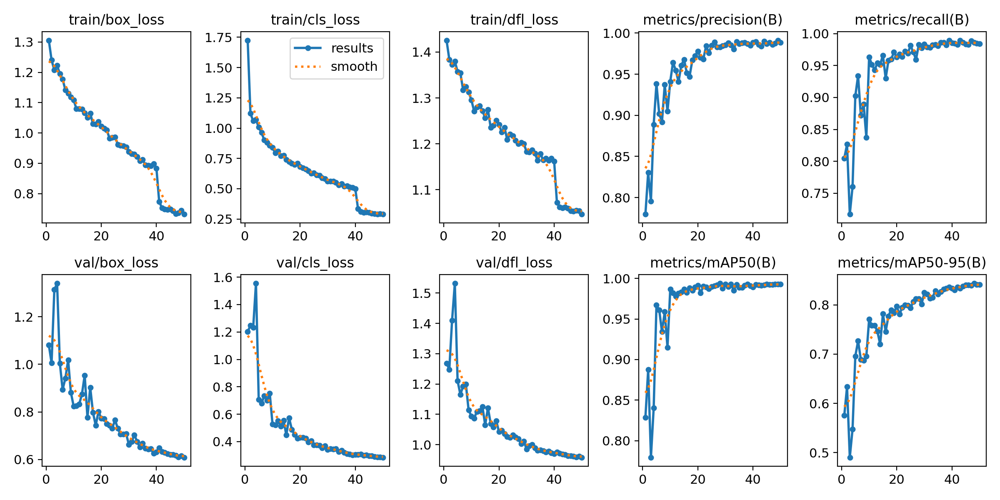


--- confusion_matrix_normalized.png ---


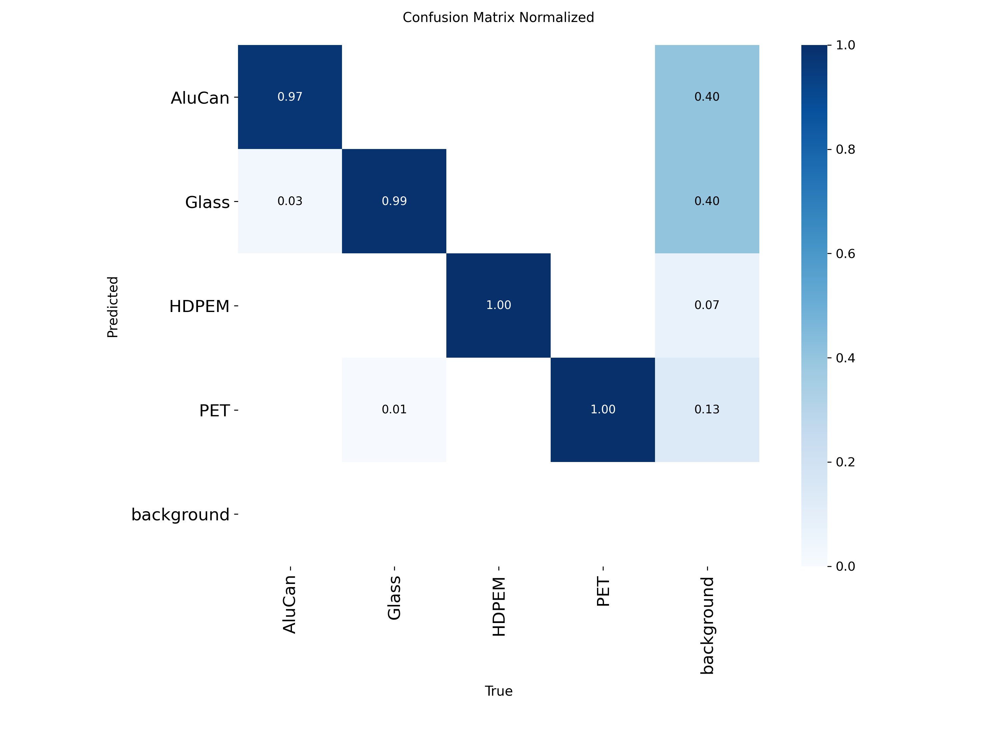

In [9]:
# Show training curves from runs folder
from IPython.display import Image as IPImage
import os
run_dir = '/content/runs/waste_yolov8m'
for img_name in ['results.png', 'confusion_matrix_normalized.png', 'PR_curve.png', 'F1_curve.png']:
    path = f'{run_dir}/{img_name}'
    if os.path.exists(path):
        print(f'\n--- {img_name} ---')
        display(IPImage(path))

## 📈 Step 4: Evaluate on Test Set

In [10]:
import json

model = YOLO(BEST_WEIGHTS)

metrics = model.val(
    data     = f'{OUTPUT_DIR}/data.yaml',
    split    = 'test',
    conf     = 0.25,
    iou      = 0.5,
    plots    = True,
    project  = '/content/eval',
    name     = 'test_results',
    exist_ok = True,
)

f1 = 2 * metrics.box.mp * metrics.box.mr / (metrics.box.mp + metrics.box.mr + 1e-9)

print('\n' + '='*50)
print('      PERFORMANCE METRICS — TEST SET')
print('='*50)
print(f'  mAP@0.5       : {metrics.box.map50:.4f}')
print(f'  mAP@0.5:0.95  : {metrics.box.map:.4f}')
print(f'  Precision     : {metrics.box.mp:.4f}')
print(f'  Recall        : {metrics.box.mr:.4f}')
print(f'  F1 Score      : {f1:.4f}')
print('='*50)
print('\nPer-class AP@0.5:')
for i, name in enumerate(CLASS_NAMES):
    print(f'  {name:10s}: {metrics.box.ap50[i]:.4f}')

Ultralytics 8.4.62 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 147.5±241.8 MB/s, size: 173.9 KB)
val: Scanning /content/waste_dataset/test/labels... 487 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 487/487 461.0it/s 1.1s
val: New cache created: /content/waste_dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 31/31 4.2it/s 7.4s
                   all        487        527      0.986      0.988      0.992      0.832
                AluCan        111        118      0.983      0.994      0.994      0.784
                 Glass        125        153      0.983      0.967      0.984      0.817
                 HDPEM        104        104      0.993          1      0.995      0.849
                   PET        152        152      0.987      0.989      

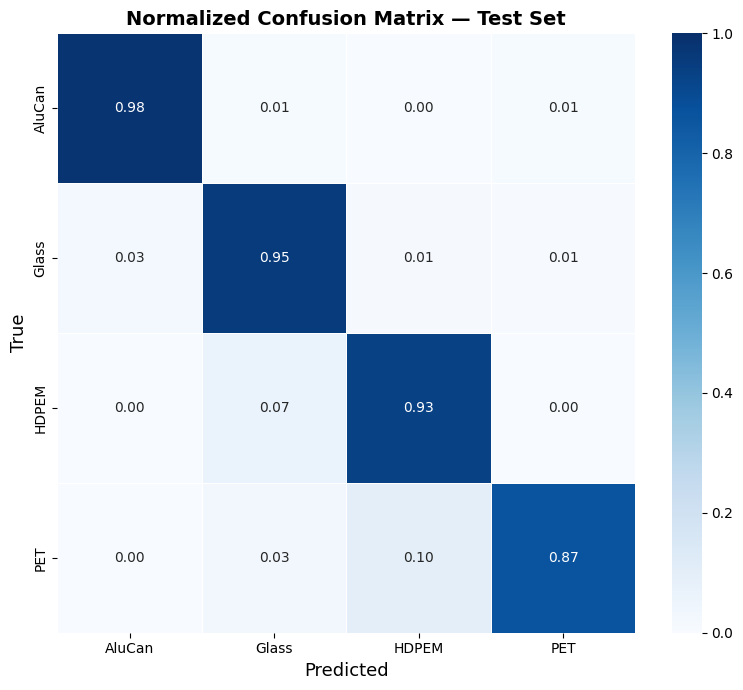

In [11]:
# ── Confusion matrix ─────────────────────────────────────────────────────────
import seaborn as sns
from sklearn.metrics import confusion_matrix

test_img_dir = Path(OUTPUT_DIR) / 'test' / 'images'
test_lbl_dir = Path(OUTPUT_DIR) / 'test' / 'labels'

y_true, y_pred = [], []

for img_path in sorted(test_img_dir.glob('*.jpg'))[:400]:
    lbl_path = test_lbl_dir / (img_path.stem + '.txt')
    if not lbl_path.exists(): continue
    with open(lbl_path) as f:
        for line in f:
            p = line.strip().split()
            if p: y_true.append(int(p[0]))
    res = model.predict(str(img_path), conf=0.25, verbose=False)
    for r in res:
        if r.boxes:
            for cid in r.boxes.cls.cpu().numpy().astype(int):
                y_pred.append(cid)

mn = min(len(y_true), len(y_pred))
cm = confusion_matrix(y_true[:mn], y_pred[:mn],
                      labels=list(range(4)), normalize='true')

fig, ax = plt.subplots(figsize=(8, 7))
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            linewidths=0.5, ax=ax, vmin=0, vmax=1)
ax.set_xlabel('Predicted', fontsize=13)
ax.set_ylabel('True', fontsize=13)
ax.set_title('Normalized Confusion Matrix — Test Set', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/confusion_matrix.png', dpi=150)
plt.show()

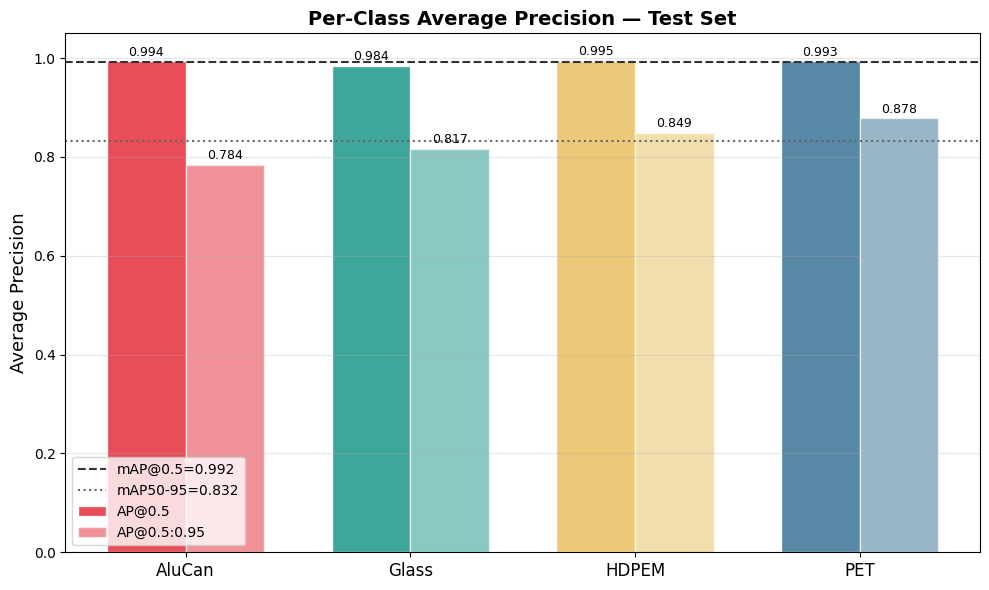

In [12]:
# ── Per-class mAP bar chart ───────────────────────────────────────────────────
x = np.arange(len(CLASS_NAMES)); w = 0.35
ap50   = metrics.box.ap50[:4]
ap5095 = metrics.box.ap[:4]

fig, ax = plt.subplots(figsize=(10, 6))
b1 = ax.bar(x - w/2, ap50,   w, label='AP@0.5',       color=COLORS, alpha=0.9, edgecolor='white')
b2 = ax.bar(x + w/2, ap5095, w, label='AP@0.5:0.95', color=COLORS, alpha=0.55, edgecolor='white')
ax.axhline(metrics.box.map50, color='#333', ls='--', lw=1.5, label=f'mAP@0.5={metrics.box.map50:.3f}')
ax.axhline(metrics.box.map,   color='#666', ls=':',  lw=1.5, label=f'mAP50-95={metrics.box.map:.3f}')
ax.set_xticks(x); ax.set_xticklabels(CLASS_NAMES, fontsize=12)
ax.set_ylim(0, 1.05); ax.set_ylabel('Average Precision', fontsize=13)
ax.set_title('Per-Class Average Precision — Test Set', fontsize=14, fontweight='bold')
ax.legend(); ax.grid(axis='y', alpha=0.3)
for bar in list(b1)+list(b2):
    ax.annotate(f'{bar.get_height():.3f}',
                xy=(bar.get_x()+bar.get_width()/2, bar.get_height()),
                xytext=(0,4), textcoords='offset points', ha='center', fontsize=9)
plt.tight_layout()
plt.savefig('/content/per_class_ap.png', dpi=150)
plt.show()

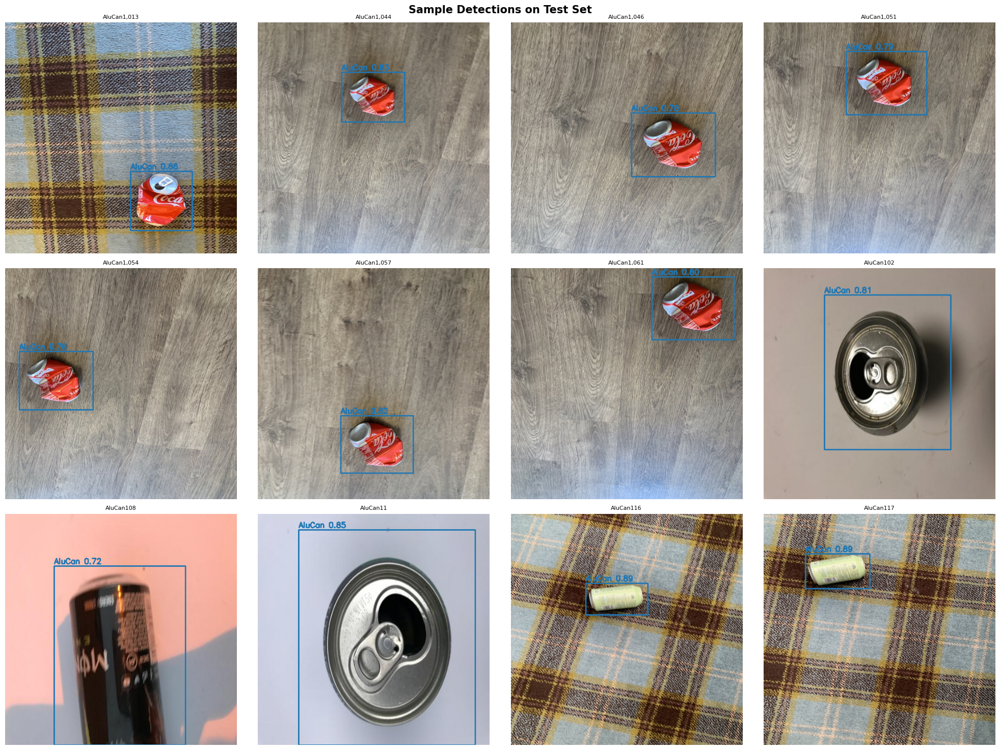

In [13]:
# ── Sample prediction grid ────────────────────────────────────────────────────
test_imgs = sorted(test_img_dir.glob('*.jpg'))[:12]
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle('Sample Detections on Test Set', fontsize=15, fontweight='bold')

for ax, ip in zip(axes.flatten(), test_imgs):
    img = cv2.cvtColor(cv2.imread(str(ip)), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (512, 512))
    res = model.predict(str(ip), conf=0.25, verbose=False)
    for r in res:
        if r.boxes is None: continue
        h, w = img.shape[:2]
        for box, cid, conf in zip(r.boxes.xyxyn.cpu().numpy(),
                                   r.boxes.cls.cpu().numpy().astype(int),
                                   r.boxes.conf.cpu().numpy()):
            x1,y1,x2,y2 = (box*[w,h,w,h]).astype(int)
            col = tuple(int(c*255) for c in plt.cm.tab10(cid)[:3])
            cv2.rectangle(img,(x1,y1),(x2,y2),col,2)
            cv2.putText(img,f'{CLASS_NAMES[cid]} {conf:.2f}',(x1,max(y1-5,12)),
                        cv2.FONT_HERSHEY_SIMPLEX,0.55,col,2)
    ax.imshow(img); ax.axis('off'); ax.set_title(ip.stem, fontsize=8)

for ax in axes.flatten()[len(test_imgs):]:
    ax.axis('off')
plt.tight_layout()
plt.savefig('/content/sample_predictions.png', dpi=150)
plt.show()

## 🔥 Step 5: Feature Activation Heatmaps

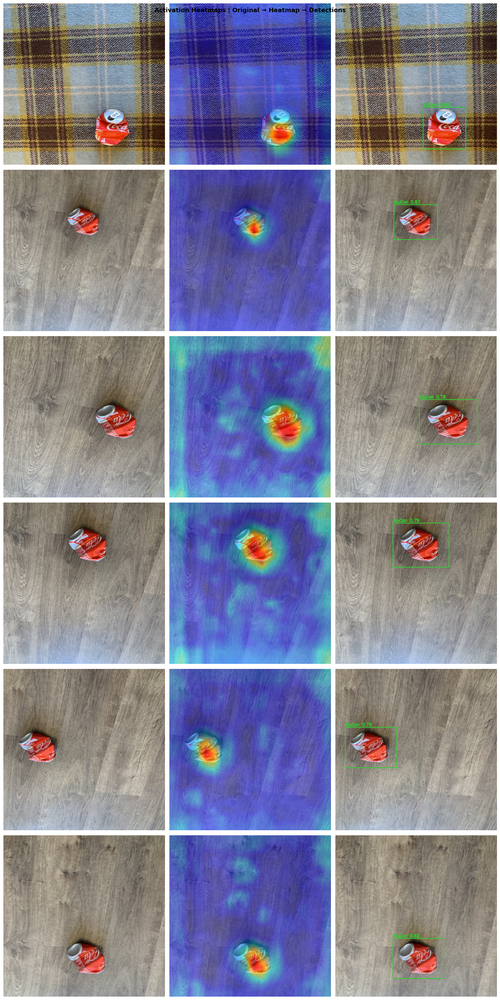

In [17]:
import torch

def get_heatmap(model_yolo, img_path):
    net = model_yolo.model; net.eval()
    act = {}
    def hook(m, i, o): act['f'] = o.detach()
    h = net.model[-4].register_forward_hook(hook)
    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (640, 640))
    t   = torch.from_numpy(img).permute(2,0,1).float().unsqueeze(0)/255
    t   = t.to(model_yolo.device) # Move tensor to the same device as the model
    with torch.no_grad(): net(t)
    h.remove()
    hm = act['f'][0].mean(0).cpu().numpy()
    hm = (hm - hm.min()) / (hm.max() - hm.min() + 1e-8)
    return img, cv2.resize(hm, (640,640))

test_imgs = sorted(test_img_dir.glob('*.jpg'))[:6]
fig, axes = plt.subplots(len(test_imgs), 3, figsize=(15, 5*len(test_imgs)))
fig.suptitle('Activation Heatmaps | Original → Heatmap → Detections',
             fontsize=13, fontweight='bold')

for idx, ip in enumerate(test_imgs):
    orig, hm = get_heatmap(model, str(ip))
    cm_img   = cv2.applyColorMap((hm*255).astype(np.uint8), cv2.COLORMAP_JET)
    overlay  = cv2.addWeighted(orig, 0.55,
                               cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB), 0.45, 0)
    det      = orig.copy()
    res = model.predict(str(ip), conf=0.25, verbose=False)
    for r in res:
        if r.boxes:
            h2, w2 = det.shape[:2]
            for box, cid, c in zip(r.boxes.xyxyn.cpu().numpy(),
                                    r.boxes.cls.cpu().numpy().astype(int),
                                    r.boxes.conf.cpu().numpy()):
                x1,y1,x2,y2 = (box*[w2,h2,w2,h2]).astype(int)
                cv2.rectangle(det,(x1,y1),(x2,y2),(50,205,50),2)
                cv2.putText(det,f'{CLASS_NAMES[cid]} {c:.2f}',(x1,max(y1-5,12)),
                            cv2.FONT_HERSHEY_SIMPLEX,0.55,(50,205,50),2)
    for ax, im in zip(axes[idx], [orig, overlay, det]):
        ax.imshow(im); ax.axis('off')

plt.tight_layout()
plt.savefig('/content/heatmaps.png', dpi=150)
plt.show()

## 🌐 Step 6: Deploy Gradio Web App

In [18]:
!pip install gradio -q

In [19]:
import gradio as gr
import io
from PIL import Image

RECYCLING_TIPS = {
    'AluCan': '♻️ Aluminium can: Rinse, crush, drop in metal recycling bin. 100% infinitely recyclable!',
    'Glass':  '🫙 Glass bottle: Remove cap, rinse, sort by colour. Recyclable forever without quality loss!',
    'HDPEM':  '🥛 HDPE container: Check for ♴ mark. Rinse before recycling. One of the safest plastics!',
    'PET':    '🍶 PET bottle: Look for ♳. Crush flat to save space. Widely recycled worldwide!',
}

detection_model = YOLO(BEST_WEIGHTS)

def detect(image, conf):
    if image is None: return None, None, 'No image.'
    img_rgb = np.array(image)
    res = detection_model.predict(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR),
                                  conf=conf, verbose=False)
    annotated = img_rgb.copy()
    detected  = {}
    for r in res:
        if r.boxes is None: continue
        h2,w2 = annotated.shape[:2]
        for box, cid, c in zip(r.boxes.xyxy.cpu().numpy(),
                                r.boxes.cls.cpu().numpy().astype(int),
                                r.boxes.conf.cpu().numpy()):
            x1,y1,x2,y2 = box.astype(int)
            col = tuple(int(v*255) for v in plt.cm.tab10(cid)[:3])
            cv2.rectangle(annotated,(x1,y1),(x2,y2),col,3)
            lbl = f'{CLASS_NAMES[cid]} {c:.0%}'
            tw,th = cv2.getTextSize(lbl,cv2.FONT_HERSHEY_SIMPLEX,0.65,2)[0]
            cv2.rectangle(annotated,(x1,y1-th-8),(x1+tw+8,y1),col,-1)
            cv2.putText(annotated,lbl,(x1+4,y1-4),
                        cv2.FONT_HERSHEY_SIMPLEX,0.65,(255,255,255),2)
            nm = CLASS_NAMES[cid]
            if nm not in detected or c > detected[nm]: detected[nm] = float(c)

    # Chart
    fig, ax = plt.subplots(figsize=(5,3))
    if detected:
        clss = list(detected.keys()); confs = list(detected.values())
        cols = [COLORS[CLASS_NAMES.index(c)] for c in clss]
        bars = ax.barh(clss, confs, color=cols, height=0.5, edgecolor='white')
        ax.set_xlim(0,1); ax.set_xlabel('Confidence')
        for b,v in zip(bars,confs):
            ax.text(b.get_width()+.02, b.get_y()+b.get_height()/2,
                    f'{v:.1%}', va='center')
    else:
        ax.text(0.5,0.5,'No detections', ha='center', va='center',
                transform=ax.transAxes)
    ax.set_title('Confidence'); ax.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    buf = io.BytesIO(); plt.savefig(buf,format='png',dpi=120); plt.close()
    buf.seek(0); chart = Image.open(buf).copy()

    tips = '\n\n'.join([RECYCLING_TIPS[c] for c in detected if c in RECYCLING_TIPS])
    summary = f'**Detected: {list(detected.keys())}**\n\n{tips}' if detected else '⚠️ Nothing detected.'

    return Image.fromarray(annotated), chart, summary


with gr.Blocks(title='♻️ Waste Detector', theme=gr.themes.Soft(primary_hue='teal')) as demo:
    gr.Markdown('# ♻️ Drinking Waste Detection\n**AI-powered recycling assistant — YOLOv8m**')
    with gr.Row():
        with gr.Column():
            inp   = gr.Image(label='Upload Image', type='pil', height=350)
            conf  = gr.Slider(0.1, 0.9, value=0.25, step=0.05, label='Confidence')
            btn   = gr.Button('🔍 Detect', variant='primary')
        with gr.Column():
            out_img   = gr.Image(label='Detection Result', height=350)
            out_chart = gr.Image(label='Confidence Chart', height=200)
    out_txt = gr.Markdown(label='Recycling Tips')
    btn.click(detect, [inp, conf], [out_img, out_chart, out_txt])
    inp.change(detect, [inp, conf], [out_img, out_chart, out_txt])

demo.launch(share=True)

/tmp/ipykernel_1162/3483217654.py:62: DeprecationWarning: The 'theme' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'theme' to Blocks.launch() instead.
  with gr.Blocks(title='♻️ Waste Detector', theme=gr.themes.Soft(primary_hue='teal')) as demo:


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://8af7505e7734102df9.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


## 💾 Step 7: Save All Outputs to Drive

In [20]:
import shutil, os

SAVE_DIR = '/content/drive/MyDrive/waste_detection_results'
os.makedirs(SAVE_DIR, exist_ok=True)

# Copy weights
shutil.copy(BEST_WEIGHTS, f'{SAVE_DIR}/best.pt')

# Copy plots
for fname in ['class_distribution.png', 'bbox_stats.png', 'sample_grid.png',
              'confusion_matrix.png', 'per_class_ap.png',
              'sample_predictions.png', 'heatmaps.png']:
    src = f'/content/{fname}'
    if os.path.exists(src):
        shutil.copy(src, f'{SAVE_DIR}/{fname}')
        print(f'  Saved: {fname}')

# Copy training run folder
run_src = '/content/runs/waste_yolov8m'
if os.path.exists(run_src):
    shutil.copytree(run_src, f'{SAVE_DIR}/training_run', dirs_exist_ok=True)
    print('  Saved: training_run/ folder')

print(f'\n✅ Everything saved to Google Drive: {SAVE_DIR}')

  Saved: class_distribution.png
  Saved: bbox_stats.png
  Saved: sample_grid.png
  Saved: confusion_matrix.png
  Saved: per_class_ap.png
  Saved: sample_predictions.png
  Saved: heatmaps.png
  Saved: training_run/ folder

✅ Everything saved to Google Drive: /content/drive/MyDrive/waste_detection_results


In [21]:
import shutil
shutil.copy(
    '/content/runs/waste_yolov8m/weights/best.pt',
    '/content/drive/MyDrive/best.pt'
)
print('✅ Model saved to Google Drive!')

✅ Model saved to Google Drive!


In [22]:
import shutil, os

SAVE_DIR = '/content/drive/MyDrive/waste_detection_results'
os.makedirs(SAVE_DIR, exist_ok=True)

# Save best model weights
shutil.copy('/content/runs/waste_yolov8m/weights/best.pt',
            f'{SAVE_DIR}/best.pt')

# Save all plots
for f in ['class_distribution.png', 'bbox_stats.png', 'sample_grid.png',
          'confusion_matrix.png', 'per_class_ap.png',
          'sample_predictions.png', 'heatmaps.png']:
    if os.path.exists(f'/content/{f}'):
        shutil.copy(f'/content/{f}', f'{SAVE_DIR}/{f}')

print('✅ Everything saved to Drive!')

✅ Everything saved to Drive!
